<a href="https://colab.research.google.com/github/manku13/Bank-Client-BackEnd/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog vision/"


# We've commented that because the extraction process is done.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import   matplotlib.pyplot as plt

print("TensorFlow version: ", tf.__version__)
print("TensorFlow Hub version: ", hub.__version__)

TensorFlow version:  2.14.0
TensorFlow Hub version:  0.15.0


In [ ]:
# Check for GPU availability
print("GPU", "available " if tf.config.list_physical_devices("GPU") else "not available")

GPU available 


## Accessing the data

Let's start with `label.csv` which contains all the image ID's and their assosciated dog breed (our data and labels).

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

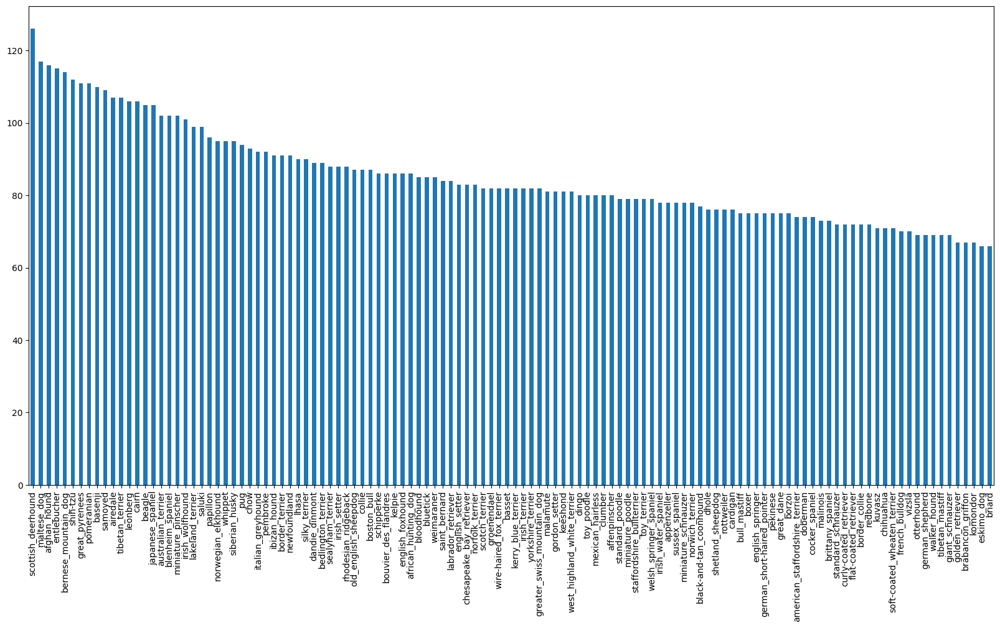

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

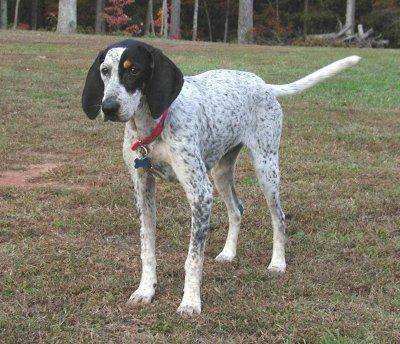

In [ ]:
# This cell is used for viewing a particular image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

## Getting images nad their labels

Let's get a list of all of our image file path names.

In [ ]:
# Create pathnames from Image ID's
filename = ["drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filename[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog vision/train/")) == len(filename):
  print("Filenames match actual amount of files... HURRAY!!!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files... HURRAY!!!


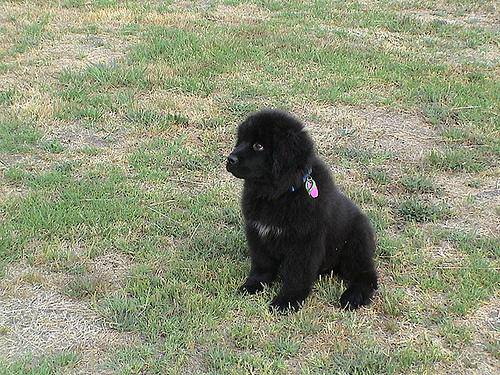

In [ ]:
Image(filename[9374])

Since we've got our trianing image filepath in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels_csv["breed"]) # does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filename):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label value
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels [0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Since we do not have valid set, we'll have to create it.

In [ ]:
# Setup X & y variables
X = filename
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.
Because while experimenting with our model we do not want to waste much time.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:500}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to wirte a function which does the following things:

1. Take the image file path as imput
2. Use TensorFlow to read the file and save it to variable, `image`.
3. Turn our image (a jpg) into Tensors
4. Resize the image to be a shape of (224, 224).
5. Return the modified image.

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filename[234])
image.shape

(333, 500, 3)

In [ ]:
image[:2]

array([[[18, 26,  2],
        [26, 34, 10],
        [21, 29,  8],
        ...,
        [11, 19,  8],
        [11, 19,  8],
        [11, 19,  8]],

       [[21, 29,  5],
        [28, 36, 12],
        [17, 25,  2],
        ...,
        [ 5, 13,  2],
        [ 7, 15,  4],
        [ 9, 17,  6]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[18, 26,  2],
        [26, 34, 10],
        [21, 29,  8],
        ...,
        [11, 19,  8],
        [11, 19,  8],
        [11, 19,  8]],

       [[21, 29,  5],
        [28, 36, 12],
        [17, 25,  2],
        ...,
        [ 5, 13,  2],
        [ 7, 15,  4],
        [ 9, 17,  6]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values (i.e. normalizing the values)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?
Let's day you're trying to process 10,000+ images in one go... they all might not fit inot memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

Now we've got a way to turn a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn them into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Create batches of data our of images (X) and label (y) paris.
  Shuffles the data if it's training data but doesn't shuffle if it's validation.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Created test data batches!!!")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Created valid data batches!!!")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Created trianing data batches!!!")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image process function is faster than shuffling it later
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Created trianing data batches!!!
Created valid data batches!!!


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Building a  model

Before we build a model, there are a few things we need to define:

  * The input shape (our images shape, in the form of Tensors) to our model.

  * The output shape (image labels, in the form of Tensors) of our model.

  * The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup imput shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep leanring model!

Knowing this, let's create a fucntion which does the following things:

  * Takes the input shape, output shape and the model we've chosen as parameters.

  * Defines the layers in a Keras model in sequential fashion.

  * Compiles the model (says it should be evaluated and improved).

  * Builds the model (tells the model the input shape it'll be getting).

  * Returns the model.


In [ ]:
# Create a function which builds a Keras model.
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with :", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input Layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output Layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during trianing to do such things as save its progress,  checkits progress or stop training early if a model stops improving.

We'll create two callbacks, one TensorBoard which helps track our models progress and  another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after the model training).

In [ ]:
# Load TensorBoard notebook extensioin
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directly for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment)
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)


 ### Early Stopping Callback

 Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops imporving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is going correctly.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min: 10, max:100, step:10}

Let's create a function which trains a model.

  * Create a model using `create_model()`
  * Setup a TensorBoard callback using `create_tensorboard_callback()`
  * Call the `fit()` function on our model passing it the training data, validation data, number of epochs to trian for (`NUM_EPOCHS`) and the callbacks we'd like to use
  * Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model.
  return model


In [ ]:
# # Fit the model to the data
# model = train_model()

As we can clearly see that our model is overfitted as it is performing far better on training set but not on validation set so it means that the "Generalize" ability of our model is still poor

But to Overfitting to begin with is a good thing. It means our model is learning.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to trained on)
predictions = loaded_model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 2s 113ms/step


array([[3.0772372e-03, 1.6230048e-04, 7.5924437e-04, ..., 1.8887052e-04,
        6.4064028e-05, 1.1745683e-03],
       [3.6240609e-03, 2.3044688e-03, 6.5927408e-03, ..., 4.1239851e-04,
        1.1651185e-03, 1.0933102e-04],
       [5.5618548e-05, 4.5180965e-05, 3.2062812e-06, ..., 9.1727261e-06,
        1.7071219e-05, 4.3071537e-05],
       ...,
       [4.1985322e-06, 3.9625342e-05, 7.8556710e-05, ..., 1.9111796e-05,
        1.6166236e-04, 1.6101421e-05],
       [7.1661915e-03, 8.2297751e-04, 1.4166796e-04, ..., 1.1922483e-04,
        4.1693740e-05, 1.0451742e-02],
       [1.9723793e-04, 1.0733851e-04, 1.6056554e-03, ..., 1.5515297e-02,
        5.9981481e-04, 1.8297018e-04]], dtype=float32)

In [ ]:
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.01994232 0.00141483 0.00425507 0.01067267 0.00279028 0.03182577
 0.00247834 0.00903614 0.00465229 0.00291066 0.01036111 0.03049614
 0.00605584 0.00109848 0.00133541 0.01403582 0.00409467 0.000482
 0.00016278 0.00306222 0.0015144  0.00259108 0.00549504 0.00105084
 0.00369695 0.00717126 0.01272669 0.00148154 0.01776368 0.00079186
 0.00458887 0.00174336 0.09519867 0.0106748  0.00631236 0.00708658
 0.0013943  0.00389515 0.00346064 0.00594259 0.00512796 0.01191326
 0.01424984 0.00331794 0.0008684  0.06331012 0.01291825 0.00109213
 0.00465515 0.00152688 0.00232122 0.00613263 0.00031281 0.01407282
 0.01647021 0.01217838 0.03568195 0.00179115 0.00246025 0.01322389
 0.00350375 0.00079275 0.00093899 0.0033072  0.06336185 0.00088739
 0.00246548 0.00163287 0.00064276 0.00026872 0.00304883 0.00566843
 0.00472809 0.00192918 0.00509995 0.01032617 0.01370451 0.00072145
 0.01219464 0.00137938 0.00204132 0.00507858 0.00557554 0.00376825
 0.00142555 0.00710605 0.00248923 0.00079229 0.00555893 0.063441

Having the above functionality is great but we want to be able to do is at scale.

And it would be even better if we could see the image the prediction is being  made on!

**Note:** Prediction probabilities are also known as `Confidence levels`.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get an predicted label based on an array of prediction probabilities
get_pred_label(predictions[34])

'great_pyrenees'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation data (true label)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got way to get:
* Prediction labels
* Validation labels (truth labels)
* Valdiation images

Let's make some function to make these all a bit more visualize.

We'll create a function which :
* Takes an array of prediction probabilities, an array of turth labels and an array of images an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the turth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if he prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}, {:2.0f}%, {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color = color)

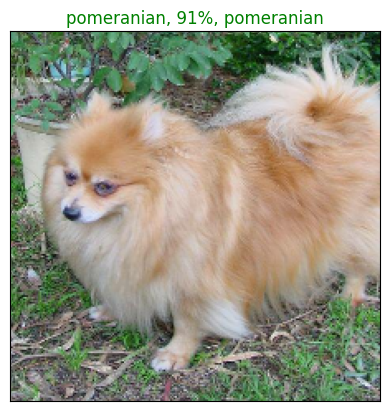

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 169)

 Now've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

 This function will:
 * Take an input of prediction probabilities array and a ground truth array and an integer
 * Find the prediction using get_pred_label()
 * Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
 * Plot the top 10 prediction probability values and labels coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 predicition labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

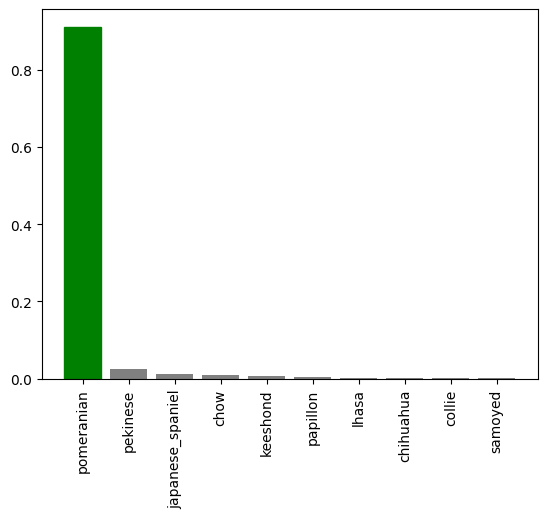

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels =val_labels,
               n = 169)

Now we've got some function to help use visualizze our predictions and evaluate our model, let's check out

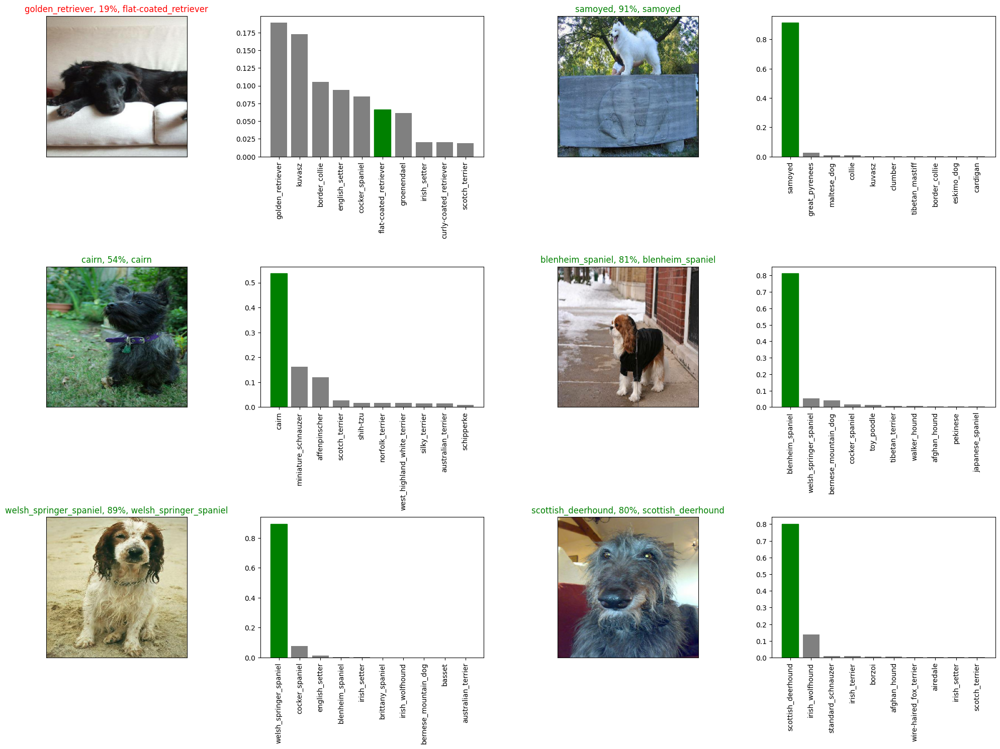

In [ ]:
# Let's check our a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog vision/models",
                          datetime.datetime.now().strftime("Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# # Save our model trained on 1000 images
# save_model(model, suffix = "1000-images-mobilenetv2-Adam")

In [ ]:
# Load a trained model
loaded_model = load_model("drive/MyDrive/Dog vision/models/Y1122-09141700644489-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/Y1122-09141700644489-1000-images-mobilenetv2-Adam.h5


In [ ]:
# # Evaluate the pre-saved model
# model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 1.2640 - accuracy: 0.6500


[1.263999342918396, 0.6499999761581421]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Created trianing data batches!!!


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validataion set when training on all data, so we can't monitor validataion
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Training for the first epoch might take about 30 minutes because GPU  we're using in the runtime has to laod all the images into memory.

In [ ]:
# # Fit the full model to the full data
# full_model.fit(x= full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
# save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog vision/models/Y1122-10011700647313-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/Y1122-10011700647313-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since out model has been trained on images in the form of Tensor batchesm to make predictions on the test data, we'll have to get it into the same format.

To make predictions on the test data we'll:

* Get the test image filenames.
* Convert the filenames into test data batchs using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test bathches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/Dog vision/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 'drive/MyDrive/Dog vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Dog vision/test/e4c37f2fbeabc98e168ebf4abce59370.jpg',
 'drive/MyDrive/Dog vision/test/e715c53e3d189a20760ef4d891a865dc.jpg',
 'drive/MyDrive/Dog vision/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg',
 'drive/MyDrive/Dog vision/test/e29f03a924c493b29d17877204dd0205.jpg',
 'drive/MyDrive/Dog vision/test/e383a31009f0779536d43816c10bf662.jpg',
 'drive/MyDrive/Dog vision/test/e726ac27864ecbde1f5822c4d6e26c17.jpg',
 'drive/MyDrive/Dog vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Created test data batches!!!


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model  and passing it hte test data batch will take a long time to run. This is because we've to process about 10000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# # Make predictions on test data batch using the loaded full model
# test_predictions = loaded_full_model.predict(test_data,
#                                              verbose = 1)

In [ ]:
# # Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("drive/MyDrive/Dog vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[1.82777482e-09, 6.09055504e-13, 1.09482934e-09, ...,
        1.60388629e-11, 7.92096597e-12, 1.57156807e-12],
       [2.81453231e-05, 1.26259408e-06, 4.06981371e-07, ...,
        1.08777964e-08, 2.19064550e-05, 1.82296990e-05],
       [1.63275088e-11, 5.48554969e-15, 7.39802178e-11, ...,
        2.01919059e-12, 8.24102842e-10, 1.65469292e-08],
       ...,
       [1.52238444e-09, 4.01295941e-10, 2.71237949e-10, ...,
        1.35674594e-09, 1.88943883e-08, 2.30170105e-08],
       [1.25975133e-10, 7.39700499e-06, 4.22342161e-08, ...,
        5.36414562e-04, 3.06602708e-08, 1.62566121e-08],
       [9.96756011e-11, 1.32969441e-10, 1.77984357e-14, ...,
        3.88328014e-15, 5.63532138e-14, 3.50200533e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Create a pandas DataFrame with empyt columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))

In [ ]:
# Append test image ID'S to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e59d59ffbb65d9eae166d4068af5d9b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e702ddff98bd0b05ab200ffb43fb080a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4c37f2fbeabc98e168ebf4abce59370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e715c53e3d189a20760ef4d891a865dc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e59d59ffbb65d9eae166d4068af5d9b9,1.827775e-09,6.090555e-13,1.094829e-09,2.863827e-11,5.440668e-10,3.850021e-14,8.536381e-11,1.524646e-09,3.342636e-09,...,3.206684e-08,1.327902e-08,4.104700e-11,5.469259e-14,1.033751e-11,3.061643e-12,1.255589e-10,1.603886e-11,7.920966e-12,1.571568e-12
1,e702ddff98bd0b05ab200ffb43fb080a,2.814532e-05,1.262594e-06,4.069814e-07,2.822459e-09,1.700741e-09,8.178778e-09,1.611415e-09,1.232611e-07,1.474061e-08,...,4.166789e-06,1.919848e-08,4.141290e-11,3.130856e-10,9.386131e-11,6.537598e-10,4.911248e-07,1.087780e-08,2.190646e-05,1.822970e-05
2,e379ba26a5e2e22e85975b839e0e401b,1.632751e-11,5.485550e-15,7.398022e-11,2.419722e-12,9.756256e-13,4.247140e-09,4.128385e-11,4.337901e-09,8.552730e-16,...,5.418749e-10,9.999994e-01,2.567010e-13,4.628495e-11,4.441195e-13,2.302103e-12,1.901352e-09,2.019191e-12,8.241028e-10,1.654693e-08
3,e4c37f2fbeabc98e168ebf4abce59370,1.073819e-07,1.941365e-07,2.389675e-08,2.096638e-10,9.178846e-10,3.316293e-08,3.467096e-08,2.727338e-10,2.450057e-08,...,7.308163e-11,3.957992e-08,1.070085e-09,6.119757e-08,5.185436e-08,1.984187e-10,3.913262e-02,1.943721e-06,3.684053e-07,1.581365e-09
4,e715c53e3d189a20760ef4d891a865dc,2.161638e-10,2.025420e-08,4.326241e-09,1.202432e-05,1.055787e-06,1.802973e-07,3.287092e-06,3.825942e-07,1.141594e-04,...,4.338366e-08,8.483481e-09,5.843226e-05,9.465616e-01,4.619219e-06,2.031548e-08,3.520434e-07,1.235055e-07,1.129847e-03,2.289844e-09


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog vision/my-dog-photos/random dog.jpg',
 'drive/MyDrive/Dog vision/my-dog-photos/random 11.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Created test data batches!!!


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 596ms/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['bernese_mountain_dog', 'labrador_retriever']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

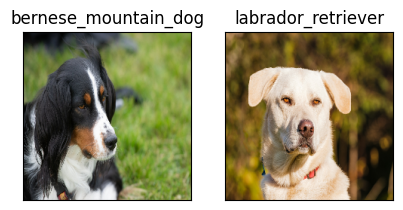

In [ ]:
# Check custom image predictions
# def rotate_image(image):
#     return np.rot90(image, k=-1)

plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  # rotated_image = rotate_image(image)
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)